AIM: how does the time within trial (go cue vs near target) and the trial to trial variation affect the linearity of firing rates? 

In [113]:
# to use cd, etc
import sys
import os

import numpy as np
from numpy import linalg, matlib
# save, import and load data
from numpy import asarray, save, load
# needed for some matrix manipulations
import cvxpy as cp
import math 

import scipy
# for curve fitting
from scipy import optimize
from scipy.io import loadmat  # this is the SciPy module that loads mat-files

import mat73

import matplotlib.pyplot as plt
# for plots
import seaborn
# set up seaborn for the plots
seaborn.set()

# suppress deprecation warnings
import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

# # to save data plots
# from matplotlib.backends.backend_pdf import PdfPages

In [114]:
import matplotlib.pylab as pylab
params = {'legend.fontsize': 'large',
          'figure.figsize': (8, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
pylab.rcParams.update(params)

In [115]:
# decDir = 'decoderParams_jeev072312_080412.mat'
# nDir is trial-aligned to the go cue and uses all the trial data
nDir = 'catNeuralDat_jeev072312_080412_trE6_B100.mat'
pathDir = '/Volumes/GoogleDrive/Shared drives/aoLab/Data/bmiLearning_jeev/jeev072312_080412'
os.chdir(pathDir)
os.getcwd()

'/Volumes/GoogleDrive/Shared drives/aoLab/Data/bmiLearning_jeev/jeev072312_080412'

In [116]:
n_path = pathDir + '/' + nDir

In [117]:
n_dict = mat73.loadmat(n_path,use_attrdict=True)
n_dict.keys()

dict_keys(['N_bmi', 'N_mc', 'N_norm_bmi', 'N_vfb', 'binvector', 'bmiDay', 'bmiDecoderInd', 'bmiDecoders', 'bmiSessions', 'bmiUnitInds', 'bmiUnitInds_all', 'bmiUnits', 'bmiUnits_all', 'day', 'days', 'mcDay', 'mcSessions', 'params', 'sessID_bmi', 'sessID_mc', 'sessID_vfb', 'sessions', 'trEs_bmi', 'trEs_mc', 'trEs_vfb', 'trTs_bmi', 'trTs_mc', 'trTs_vfb', 'vfbDay', 'vfbSessions'])

In [118]:
# # saving plots
# outpath = "/Users/mmadduri/Documents/PhD/ResearchMaterials/Code/BMI_Model/data/jeev_analysis"
# pp = PdfPages(outpath + 'multipage.pdf')

## Functions

findBMIUnitsOnly: takes in all of neural data dict and the n_bmi matrix in the neural dictionary to output only the n_bmi of units that were in the decoder

In [119]:
def findBmiUnitsOnly(neuronData_dict, neural_bmi_matx):
    # divide by .1 to get firing rates not spike counts (spike counts binned in 100 ms)
#     n_bmi = neuronData_dict['N_bmi']/.1;
#     n_bmi = neuronData_dict['N_norm_bmi']/.1;
    n_bmi = neural_bmi_matx
    # n_bmi = num time bins x num neurons total x trials (total)

    # off by one, python to matlab
   

    # find the units that I care about (bmiUnitsInds_all)
    n_units = neuronData_dict['bmiUnitInds_all'] - 1
    n_units = n_units.astype('int')
#     print(n_units)
    print("Units that we care about:", n_units)

    # should be the same as the number of units in bmiUnitsInds_all
    n_bmiUnits = n_bmi[:, n_units, : ];

    n_shape = n_bmiUnits.shape
    print("shape of n_bmiUnits:", n_shape)
    if n_shape[1] != neuronData_dict['bmiUnitInds_all'].size:
        print("error in converting n_bmiUnits")
        return 0
    else:
        return n_bmiUnits

getTrialByDecoder: 

RETURNS

bmiDecTrial: bmiDecTrial is a trial num x 1 vector that assigs each trial to a decoder

trialsByDecoder: number of trials in each decoder

trialsBySession: number of trials in each session

In [120]:
def getTrialsByDecoder(n_dict):
    # separate into decoders
    sessID_bmi = n_dict['sessID_bmi'] 
    bmiDecInd = n_dict['bmiDecoderInd']
    numTrials = n_dict['trEs_bmi'].shape[0]
    
    print(sessID_bmi)
    print(sessID_bmi.shape)
    print(bmiDecInd)
    print(bmiDecInd.shape)
    print(numTrials)
    numberSession = int(max(sessID_bmi))
    print("Number of Sessions:", numberSession)
    numberDecoders = int(max(bmiDecInd))
    print("Number of Decoders:", numberDecoders)
    bmiDecTrial = np.zeros(numTrials)
    # take value of sessID_bmi --> val_sessID
    # replace with the value of bmiDecInd at index of (val_sessID)

    sessID_bmiOff = sessID_bmi - 1
    bmiDecTrial = bmiDecInd[sessID_bmiOff.astype(int)]

    # print number of trials in each session
    trialsBySession = np.zeros(numberSession)
    trialsByDecoder = np.zeros(numberDecoders)
    for iT in range(numberSession):
        print("Session ID:", iT + 1) # off by one for matlab
        print("Decoder Used: ", int(bmiDecInd[iT]))
    #     print(np.where(sessID_bmiOff == iT)) # also off by one in matlab
        print("Total Number of Trials in Sessions: ", sum(sessID_bmiOff == iT))
        trialsBySession[iT] = sum(sessID_bmiOff == iT)
    #     print(int(bmiDecInd[iT]))
        trialsByDecoder[int(bmiDecInd[iT]) - 1] = trialsByDecoder[int(bmiDecInd[iT]) - 1] + sum(sessID_bmiOff == iT)

    print(trialsByDecoder)

    # bmiDecTrial is a trial num x 1 vector that assigs each trial to a decoder
    plt.plot(bmiDecTrial, '.')
    plt.title("Trials by Decoder Visualization")
    plt.xlabel("Trial Number")
    
    return (bmiDecTrial, trialsByDecoder, trialsBySession)


returnDecoderIndices: 

helper function that returns the starting trial and end trial of each decoder

INPUT:
decoderTrials - output of (n_bmiUnitsDec, bmiTrialsPerDecoder, bmiTrialsPerSession = getTrialsByDecoder(n_dict))

In [121]:
def returnDecoderIndices(decoderTrials, decNumber):
    if decNumber == 1:
        start = 0
    else:
        start = decoderTrials[decNumber-2]
    
    end = start + decoderTrials[decNumber-1]
    return (int(start),int(end))

Return n_BMI with only decoder that we care about

In [122]:
def return_nBMI_decoder(nData, decoderTrials, decNumber):
    startInd, endInd = returnDecoderIndices(decoderTrials, decNumber)
    return nData[:,:, startInd:endInd]

sorts the n_bmi matrix by target

In [123]:
# assume input = time x units x trials (total)
def sortTargetNeuralData(neuralData_timeUnitsTrials, targetsVector):
    print("Starting nData dims", neuralData_timeUnitsTrials.ndim)
    if neuralData_timeUnitsTrials.ndim != 3:
        # assume it's been time-binned
        neuralData_timeUnitsTrials = np.expand_dims(neuralData_timeUnitsTrials, axis = 0)
    print("nData shape", neuralData_timeUnitsTrials.shape)    
    
    # TODO: maybe more efficient way to do this?
    targ1 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 1)[0]]    
    targ2 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 2)[0]]
    targ3 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 3)[0]]
    targ4 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 4)[0]]
    targ5 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 5)[0]]
    targ6 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 6)[0]]    
    targ7 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 7)[0]]
    targ8 = neuralData_timeUnitsTrials[:, :, np.where(targetsVector == 8)[0]]
    
    return (targ1, targ2, targ3, targ4, targ5, targ6, targ7, targ8)

inputs:

(1) time x neurons x trials vector

(2) targVector (1 x trials)

outputs:

targPositionVector = 3 x trials

In [124]:
def TargPositionVector(neuralData_timeUnitsTrials, targetsVector):
    print("Starting nData dims", neuralData_timeUnitsTrials.ndim)
    numTrials = neuralData_timeUnitsTrials.shape[-1]
    targPositionVector = np.zeros((3, numTrials))
    
    for iT in range(8):
        print("target:", iT + 1)
        print("x:",  np.cos(np.pi/4 * iT))
        print("y:",  np.sin(np.pi/4 * iT))
        
        targPositionVector[0, np.where(targetsVector == (iT + 1))[0]] = iT + 1
        targPositionVector[1, np.where(targetsVector == (iT + 1))[0]] = np.cos(np.pi/4 * iT)
        targPositionVector[2, np.where(targetsVector == (iT + 1))[0]] = np.sin(np.pi/4 * iT)
   
    return targPositionVector

Least-squares

In [125]:
# assuming: b = m x 1, x = n x 1
# for brain: Wt = f; A = W, t = x, f = b; m = neurons x 1; n = dims x 1
def findA_leastSquares(b, x, m, n):
    A = cp.Variable((m, n)) # A.value = none here
    print("a shape:", A.shape)
    print("x shape:", x.shape)
    print("b shape:", b.shape)
    cost = cp.sum_squares(A @ x - b)
    prob = cp.Problem(cp.Minimize(cost))
    optimalValue = prob.solve()
    # A.value = something here
    resdVect = A@x-b
#     resdNorm = cp.norm(A @ x - b, p=2).value
    return (A, optimalValue, resdVect)

def findW_leastSquares(firingRate, targPosition, numNeurons, numDim):
    return findA_leastSquares(firingRate, targPosition, numNeurons, numDim)

# def findW_leastSquares(firingRate, targPosition, numNeurons, numDim):
#     return scipy.stats.linregress(targPosition[0,:], firingRate) 

R-squared Function

In [126]:
# n = num neurons, m = number of trials
# y = firing rates measures
# y_estimate = firing rates found from least squares
# def findRsquared(y, y_estimate, n, m):
def findRsquared(y, y_estimate, n):
    # ybar 
    ybar = np.average(y, axis=1) # should be n x 1
    SStot = []
    SSres = []
    for iN in range(n):
        res_avg = y_estimate[iN,:] - ybar[iN]
        res_est = y_estimate[iN,:] - y[iN, :]
        SStot.append(np.dot(res_avg, res_avg))
        SSres.append(np.dot(res_est, res_est))
    SStot = np.asarray(SStot)
    SSres = np.asarray(SSres)
    R2 = 1 - SSres / SStot
    return (R2, SStot, SSres)


def return_r2(y, y_fit):
    ss_res = np.sum((y - y_fit) ** 2)

    # total sum of squares
    ss_tot = np.sum((y - np.mean(y)) ** 2)

    # r-squared
    r2 = 1 - (ss_res / ss_tot)
    
    return(r2)

Find W matrix from Neural Data

In [127]:
# input: nData, nTargData, numNeurons, numTargDim, trialWindow)
# output:  return (rsquared_, w_estimate)
def findWfromNeuralData(nData, nTargData, numNeurons, numTargDim, trialWindow):
    iterations = int(nData.shape[-1]/trialWindow)
    print("number of iter ", iterations)
    rsquared_ = np.zeros((numNeurons, iterations))

    for iT in range(iterations):
        # window start and stop
        iS = iT*n_tr
        iE = (iT+1)*n_tr

        fr = standardizeArray(nData[:, iS:iE])
        targ = nTargData[:, iS:iE][1:]

        w_estimate, solve, resdVect = findW_leastSquares(fr, targ, numNeurons, numTargDim)
        w_estimate = w_estimate.value
        fs_estimate = w_estimate@targ
#         (R2, SStot, SSres) = findRsquared(fr, fs_estimate, numNeurons, trialWindow)
        (R2, SStot, SSres) = findRsquared(fr, fs_estimate, numNeurons) #, trialWindow)
        R2[R2 < 0] = 0
        rsquared_[:, iT] = R2

    seaborn.heatmap(rsquared_)
    plt.ylabel("Neurons")
    plt.xlabel("Trials in Session")
    plt.title("R-squared of Firing Rates Estimate, # of trials =" + str(n_tr))
    
    return (rsquared_, w_estimate)

Return only successful trials

In [128]:
def findSuccessfulTrials(trEvents, succCol):
#     successIdx = np.where(trEvents[:, 6] == (8 | 9))[0]
    successIdx = np.where( (trEvents[:, succCol] == 8) | (trEvents[:, succCol] == 9) )[0]
    print("success indx shape:", successIdx.shape, "out of total events:", len(trEvents) )
#     return n_bmi[:, :, successIdx]
    return successIdx

Normalize input array

In [129]:
# rescale to [0, 1]
def normalizeArray(array_in):
    return (array_in - np.min(array_in))/ (np.max(array_in) - np.min(array_in))    

Standardize input array

In [130]:
# rescale to mean 0
def standardizeArray(array_in):
    return (array_in - np.mean(array_in))/ (np.max(array_in) - np.min(array_in))    

Cosine-tuning Code

In [131]:
# target: array([1, 2, 3, 4, 5, 6, 7, 8])
# f = a*cos(x) + b*sin(x) + c
def cosine_func(target, b1, b2, b3):
    '''
    Args:
        target (int) center out task target index ( takes values from 1 to 8)
        b1, b2, b3 : parameters used for curve fitting
    .. math::
    b1 * cos(theta) + b2 * sin(theta) + b3
    Returns: result from above equation
    '''
    theta = 45 * (target - 1)
    return b1 * np.cos(np.deg2rad(theta)) + b2 * np.sin(np.deg2rad(theta)) + b3

def linear_func(target, b1, b2, b3):
    '''
    Args:
        target = array of x, y cartesian coordinates
                this should be: target 1 = (1, 0), target 2 = 
        b1, b2, b3 : parameters used for curve fitting
    .. math::
    b1 * cos(theta) + b2 * sin(theta) + b3
    Returns: result from above equation
    '''
    targ_x = np.cos((target - 1) * np.pi/4)
    targ_y = np.sin((target - 1) * np.pi/4)
    return b1 * targ_x + b2 * targ_y + b3

def curveFitting(func_arg, x_data, y_data):
    params, params_covariance = optimize.curve_fit(func_arg, x_data, y_data) 
    return (params, params_covariance)

Plotting Colors

# Code using functions

In [20]:
# find only the BMI units
n_bmiUnits = findBmiUnitsOnly(n_dict, n_dict['N_norm_bmi']/.1) # divide by .1 to convert spikes/100 ms to Hz

Units that we care about: [ 50  85 105 140 145 215 220 225 270 300 355 395 440 520 545 590 595 610
 635]
shape of n_bmiUnits: (40, 19, 9827)


In [132]:
# NEED TO USE THIS TO SEE THE SUCCESS COLUMN
n_dict['trEs_bmi'][1:10,:]

array([[ 12.,   2.,  70.,  15.,   5.,   6.,   7.,   9.,  11.],
       [  4.,   2.,  64.,  15.,   5.,   6.,  12.,   2.,  64.],
       [  4.,   2.,  64.,  15.,   5.,   6.,  12.,   2.,  64.],
       [  4.,   2.,  64.,  15.,   5.,   6.,  12.,   2.,  64.],
       [  4.,   2.,  64.,  15.,   5.,   6.,   7.,   8.,   2.],
       [  8.,   2.,  64.,  15.,   5.,   6.,  12.,   2.,  64.],
       [  4.,   2.,  64.,  15.,   5.,   6.,  12.,   2.,  64.],
       [200.,   2.,  67.,  15.,   5.,   6.,  12.,   2.,  67.],
       [  4.,   2.,  67.,  15.,   5.,   6.,  12.,   2.,  67.]])

In [133]:
# set the column with the 9s, 8s, etc as the success column
succCol = 6
n_dict['trEs_bmi'][:, succCol]

array([12.,  7., 12., ...,  7.,  7.,  7.])

[ 1.  1.  1. ... 30. 30. 30.]
(9827,)
[1. 1. 1. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3. 4. 5. 5. 5. 6. 7. 7. 7. 7. 7. 7.
 7. 8. 8. 8. 8. 9.]
(30,)
9827
Number of Sessions: 30
Number of Decoders: 9
Session ID: 1
Decoder Used:  1
Total Number of Trials in Sessions:  17
Session ID: 2
Decoder Used:  1
Total Number of Trials in Sessions:  8
Session ID: 3
Decoder Used:  1
Total Number of Trials in Sessions:  16
Session ID: 4
Decoder Used:  2
Total Number of Trials in Sessions:  337
Session ID: 5
Decoder Used:  2
Total Number of Trials in Sessions:  304
Session ID: 6
Decoder Used:  2
Total Number of Trials in Sessions:  264
Session ID: 7
Decoder Used:  2
Total Number of Trials in Sessions:  432
Session ID: 8
Decoder Used:  2
Total Number of Trials in Sessions:  327
Session ID: 9
Decoder Used:  2
Total Number of Trials in Sessions:  327
Session ID: 10
Decoder Used:  2
Total Number of Trials in Sessions:  64
Session ID: 11
Decoder Used:  3
Total Number of Trials in Sessions:  491
Session ID: 12
Decoder U

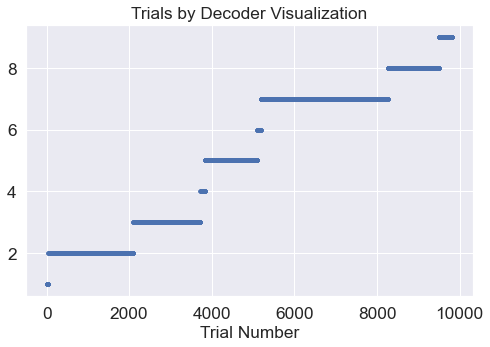

In [134]:
# shows you how the decoders are used across the trials
n_bmiUnitsDec, bmiTrialsPerDecoder, bmiTrialsPerSession = getTrialsByDecoder(n_dict)

In [135]:
n_bmiUnitsDec.shape

(9827,)

Dealing with a single decoder only

In [136]:
# start and end trial indices
decNum = 2
startInd, endInd = returnDecoderIndices(bmiTrialsPerDecoder, decNum)
(startInd, endInd)

(41, 2096)

In [137]:
n_dict['trEs_bmi'].shape

(9827, 9)

In [138]:
n_dict['trEs_bmi'][1:5]

array([[12.,  2., 70., 15.,  5.,  6.,  7.,  9., 11.],
       [ 4.,  2., 64., 15.,  5.,  6., 12.,  2., 64.],
       [ 4.,  2., 64., 15.,  5.,  6., 12.,  2., 64.],
       [ 4.,  2., 64., 15.,  5.,  6., 12.,  2., 64.]])

In [139]:
# column of success is usually the second to last so len - 1
# becomes len - 2 since start index is 0
succCol = len(n_dict['trEs_bmi'][1])-2
# get the targVector
targCol = 2

In [140]:
succIdx1 = np.where((n_dict['trEs_bmi'][startInd:endInd, succCol] == 8) | (n_dict['trEs_bmi'][startInd:endInd, succCol] == 9))[0]
succIdx1.shape

(2047,)

In [141]:
trEv = n_dict['trEs_bmi'][startInd:endInd, :]
trEv.shape
succIdx = findSuccessfulTrials(trEv, succCol)
# print(*succIdx)

success indx shape: (2047,) out of total events: 2055


now only looking at successful trials within the decoder 

In [142]:
# so looking only at successful neural data during decoder 2

# time bins x bmi units x trials for decoder 2

nBMI_decoder2 = n_bmiUnits[:,:,startInd+succIdx]

Len of targVect 2047
non-targets: [ 639  899 1657 1984]
non-targets: [2006]
Number of non-targets: 5
Num of Trials to Expect: 2042
1
Target 1 :  231.0
2
Target 2 :  202.0
3
Target 3 :  212.0
4
Target 4 :  283.0
5
Target 5 :  315.0
6
Target 6 :  313.0
7
Target 7 :  244.0
8
Target 8 :  242.0
expected number of trials


Text(0.5, 1.0, 'Number of Trials per Target in Decoder 2')

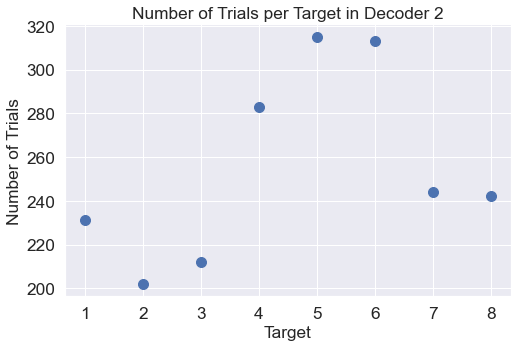

In [143]:

targVect = n_dict['trEs_bmi'][startInd+succIdx, targCol] - 63
# targVect = n_dict['trEs_bmi'][startInd:endInd, targCol] - 63
print("Len of targVect", len(targVect))
if (np.any(targVect > 8) or np.any(targVect < 1)):
    print("non-targets:", np.where(targVect > 8)[0])
    print("non-targets:", np.where(targVect < 1)[0])
    print("Number of non-targets:", len(np.where(targVect > 8)[0]) + len(np.where(targVect < 1)[0]))
    print("Num of Trials to Expect:", len(targVect)- (len(np.where(targVect > 8)[0]) + len(np.where(targVect < 1)[0])))
    
targNum = np.zeros(8) 
for iT in range(1, 9, 1):
    print(iT)
    targNum[iT-1] = len(np.where(targVect == iT)[0])
    print("Target", iT, ": ", targNum[iT-1])
sum(targNum)

if (sum(targNum) == len(targVect)- (len(np.where(targVect > 8)[0]) + len(np.where(targVect < 1)[0]))):
    print("expected number of trials")
else:
    print("error somewhere")

plt.plot(np.arange(1,9,1), targNum, '.', markersize = 20)
plt.xlabel("Target")
plt.ylabel("Number of Trials")
plt.title("Number of Trials per Target in Decoder " + str(decNum))

In [144]:
(n_bmiUnitsT1, n_bmiUnitsT2, n_bmiUnitsT3, n_bmiUnitsT4, n_bmiUnitsT5, n_bmiUnitsT6, n_bmiUnitsT7, n_bmiUnitsT8) = sortTargetNeuralData(nBMI_decoder2[:,:,:], targVect)

# check to see these match
if (n_bmiUnitsT1.shape[-1] != targNum[0]):
    print("error in targ 1")
if (n_bmiUnitsT2.shape[-1] != targNum[1]):
    print("error in targ 2")
if (n_bmiUnitsT3.shape[-1] != targNum[2]):
    print("error in targ 3")
if (n_bmiUnitsT4.shape[-1] != targNum[3]):
    print("error in targ 4")
if (n_bmiUnitsT5.shape[-1] != targNum[4]):
    print("error in targ 5")
if (n_bmiUnitsT6.shape[-1] != targNum[5]):
    print("error in targ 6")
if (n_bmiUnitsT7.shape[-1] != targNum[6]):
    print("error in targ 7")
if (n_bmiUnitsT8.shape[-1] != targNum[7]):
    print("error in targ 8")

Starting nData dims 3
nData shape (40, 19, 2047)


In [145]:
n_dict['binvector']

array([-2.00000000e+00, -1.90000000e+00, -1.80000000e+00, -1.70000000e+00,
       -1.60000000e+00, -1.50000000e+00, -1.40000000e+00, -1.30000000e+00,
       -1.20000000e+00, -1.10000000e+00, -1.00000000e+00, -9.00000000e-01,
       -8.00000000e-01, -7.00000000e-01, -6.00000000e-01, -5.00000000e-01,
       -4.00000000e-01, -3.00000000e-01, -2.00000000e-01, -1.00000000e-01,
       -2.22044605e-16,  1.00000000e-01,  2.00000000e-01,  3.00000000e-01,
        4.00000000e-01,  5.00000000e-01,  6.00000000e-01,  7.00000000e-01,
        8.00000000e-01,  9.00000000e-01,  1.00000000e+00,  1.10000000e+00,
        1.20000000e+00,  1.30000000e+00,  1.40000000e+00,  1.50000000e+00,
        1.60000000e+00,  1.70000000e+00,  1.80000000e+00,  1.90000000e+00])

Breaking up trials into 4 batches: each has about 50

In [146]:
numBins = n_bmiUnitsT1.shape[0]
numNeurons = n_bmiUnitsT1.shape[1]
numBatches = 20
numTarg = 8

In [147]:
t = n_bmiUnitsT1.shape[-1]
print(int(t/numBatches))

11


In [148]:
# Average per trial per time bin per neuron
# # 1
# def bStIndx(n_bmiUnitsT, numBatches, currBatch):
#     nTrials = n_bmiUnitsT.shape[-1]
#     start = int(nTrials/numBatches) * currBatch
# #     end = int(nTrials/numBatches) * (currBatch + 1)
#     return (start)

# def bEndIndx(n_bmiUnitsT, numBatches, currBatch):
#     nTrials = n_bmiUnitsT.shape[-1]
# #     start = int(nTrials/numBatches) * currBatch
#     end = int(nTrials/numBatches) * (currBatch + 1)
#     return (end)

# this function should stay here, used for post targ-sorting analysis
def bIndx(numBatches):
    bIndices = np.zeros((numTarg, numBatches + 1))
#     bIndEnd = np.zeros((numTarg, numBatches))
    
    trialsPerTarg = np.zeros(8)
    trialsPerTarg[0] = n_bmiUnitsT1.shape[-1]
    trialsPerTarg[1] = n_bmiUnitsT2.shape[-1]
    trialsPerTarg[2] = n_bmiUnitsT3.shape[-1]
    trialsPerTarg[3] = n_bmiUnitsT4.shape[-1]
    trialsPerTarg[4] = n_bmiUnitsT5.shape[-1]
    trialsPerTarg[5] = n_bmiUnitsT6.shape[-1]
    trialsPerTarg[6] = n_bmiUnitsT7.shape[-1]
    trialsPerTarg[7] = n_bmiUnitsT8.shape[-1]
    
    for iB in range(numBatches):
        for iTarg in range(numTarg):
            bIndices[iTarg, iB] =  int(trialsPerTarg[iTarg]/numBatches) * iB
            bIndices[iTarg, iB + 1] = int(trialsPerTarg[iTarg]/numBatches) * (iB + 1)
            
    return bIndices

In [149]:
bInd = bIndx(numBatches).astype(int)

In [150]:
n_bmiUnitsT1[:, :, bInd[0,0]:bInd[0,1]].shape

(40, 19, 11)

In [151]:
n_bmiAvgT = np.zeros((numBins, numNeurons, numBatches, numTarg))

for iB in range(numBatches):
    
    iT = 0
    # target 1
    n_bmiAvgT[:, :, iB, iT] = np.mean(n_bmiUnitsT1[:, :, bInd[iT, iB]: bInd[iT,iB + 1]], axis=2)
    iT = iT + 1
    
    # target 2
    n_bmiAvgT[:, :, iB, iT] = np.mean(n_bmiUnitsT2[:, :, bInd[iT, iB]: bInd[iT, iB + 1]], axis=2)
    iT = iT + 1
    
    # target 3
    n_bmiAvgT[:, :, iB, iT] = np.mean(n_bmiUnitsT3[:, :, bInd[iT, iB]: bInd[iT, iB + 1]], axis=2)
    iT = iT + 1
    
    # target 4
    n_bmiAvgT[:, :, iB, iT] = np.mean(n_bmiUnitsT4[:, :, bInd[iT, iB]: bInd[iT, iB + 1]], axis=2)
    iT = iT + 1
    
    # target 5
    n_bmiAvgT[:, :, iB, iT] = np.mean(n_bmiUnitsT5[:, :, bInd[iT, iB]: bInd[iT, iB + 1]], axis=2)
    iT = iT + 1
    
    # target 6
    n_bmiAvgT[:, :, iB, iT] = np.mean(n_bmiUnitsT6[:, :, bInd[iT, iB]: bInd[iT, iB + 1]], axis=2)
    iT = iT + 1
    
    # target 7
    n_bmiAvgT[:, :, iB, iT] = np.mean(n_bmiUnitsT7[:, :, bInd[iT, iB]: bInd[iT, iB + 1]], axis=2)
    iT = iT + 1
    
    # target 8
    n_bmiAvgT[:, :, iB, iT] = np.mean(n_bmiUnitsT8[:, :, bInd[iT, iB]: bInd[iT, iB + 1]], axis=2)   

In [152]:
# import matplotlib.backends.backend_pdf
# outDir = "/Users/mmadduri/Documents/PhD/ResearchMaterials/Code/BMI_Model/data/jeev_analysis/"
# outFile = 'output' + nDir + '.pdf'
# pdf = matplotlib.backends.backend_pdf.PdfPages(outDir + outFile)

In [153]:
n_bmiAvgT.shape
# time bins, neurons, batches, targets

(40, 19, 20, 8)

In [154]:
n_dict['binvector']

array([-2.00000000e+00, -1.90000000e+00, -1.80000000e+00, -1.70000000e+00,
       -1.60000000e+00, -1.50000000e+00, -1.40000000e+00, -1.30000000e+00,
       -1.20000000e+00, -1.10000000e+00, -1.00000000e+00, -9.00000000e-01,
       -8.00000000e-01, -7.00000000e-01, -6.00000000e-01, -5.00000000e-01,
       -4.00000000e-01, -3.00000000e-01, -2.00000000e-01, -1.00000000e-01,
       -2.22044605e-16,  1.00000000e-01,  2.00000000e-01,  3.00000000e-01,
        4.00000000e-01,  5.00000000e-01,  6.00000000e-01,  7.00000000e-01,
        8.00000000e-01,  9.00000000e-01,  1.00000000e+00,  1.10000000e+00,
        1.20000000e+00,  1.30000000e+00,  1.40000000e+00,  1.50000000e+00,
        1.60000000e+00,  1.70000000e+00,  1.80000000e+00,  1.90000000e+00])

In [155]:
alignCue = np.where((n_dict['binvector'] < .000001) & (n_dict['binvector'] > -.000001) == 1)[0][0]
print("align cue = ", alignCue)
print("max events = ", len(n_dict['binvector']) )

align cue =  20
max events =  40


In [156]:
from matplotlib import cm

alignCue = np.where((n_dict['binvector'] < .000001) & (n_dict['binvector'] > -.000001) == 1)[0][0]
numNeurons = n_bmiUnitsT8.shape[1]
numBins = n_bmiUnitsT8.shape[0]

start = 0
stop = 0.4
number_of_lines= numBins
cm_subsection = np.linspace(start, stop, number_of_lines) 

colors = [ cm.jet(x) for x in cm_subsection ]

normalization: x_norm = (x - x_min)/(x_max - x_min)

Within trial cosine fitting

In [157]:
x_targs = np.arange(1,9,1)
targs_xy = np.zeros((8, 2))

for x_ in x_targs:
    theta = 45*(x_ - 1)
    print("target: ", x_)
    print("x: ",  np.cos((x_ - 1)*np.pi/4))
    print("y: ", np.sin(np.deg2rad(theta)))
    targs_xy[x_ - 1] = (  np.cos((x_ - 1)*np.pi/4),  np.sin((x_ - 1)*np.pi/4))
targs_xy

target:  1
x:  1.0
y:  0.0
target:  2
x:  0.7071067811865476
y:  0.7071067811865475
target:  3
x:  6.123233995736766e-17
y:  1.0
target:  4
x:  -0.7071067811865475
y:  0.7071067811865476
target:  5
x:  -1.0
y:  1.2246467991473532e-16
target:  6
x:  -0.7071067811865477
y:  -0.7071067811865475
target:  7
x:  -1.8369701987210297e-16
y:  -1.0
target:  8
x:  0.7071067811865475
y:  -0.7071067811865477


array([[ 1.00000000e+00,  0.00000000e+00],
       [ 7.07106781e-01,  7.07106781e-01],
       [ 6.12323400e-17,  1.00000000e+00],
       [-7.07106781e-01,  7.07106781e-01],
       [-1.00000000e+00,  1.22464680e-16],
       [-7.07106781e-01, -7.07106781e-01],
       [-1.83697020e-16, -1.00000000e+00],
       [ 7.07106781e-01, -7.07106781e-01]])

In [158]:
# numTarg = 8

# tStart = alignCue
# tStop = numBins - 1 - 1
# # tStop = alignCue + 1

# r2_trials = np.zeros((tStop - tStart, numNeurons, numBatches))

# # going through each neuron
# for iN in range(numNeurons):
#     for iB in range(numBatches):
#         n_bmiTargTime = np.zeros(numTarg)

#         # for each time bin
#         fig = plt.figure(figsize=(15,5))
#         plt.subplot(1, 2, 1)
#         for iT in range(tStart, tStop, 1):
#             n_bmiTargTime = n_bmiAvgT[iT, iN, iB, :]
#             plt.plot(x_targs, n_bmiTargTime, '-o', color = 'lightsteelblue', label=iT)
#             (popt, cov) = curveFitting(cosine_func, x_targs, n_bmiTargTime)
#             plt.plot(x_targs, cosine_func(x_targs, *popt), 'g--', label='fit: a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt))
#             r2_trials[iT - tStart, iN, iB] = return_r2(n_bmiTargTime, cosine_func(x_targs, *popt)) 
#         plt.xlabel("Target")
#         plt.ylabel("Firing Rates (Hz)")
#     #     plt.legend()
#         plt.title("Neuron #" + str(iN + 1) + "| Batch " + str(iB))

#         plt.subplot(1, 2, 2)
#         plt.plot(np.arange(tStart, tStop, 1), r2_trials[:, iN])
#         plt.xlabel("time bins (from Go Cue)")
#         plt.ylabel("R-squared of Cosine Fit")
#         plt.title("R-squared of Cosine Fit | Neuron # " + str(iN + 1) + "| Batch " + str(iB))
# #         plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

## heatmap of all the r-squared values of cosine fitting the neuron tuning curves 

so this is taking the r-squared values above and compressing them to one graph

heatmap is not normalized -- so these are the raw r-squared values (checked this 06/24/21)

batches are about 500 trials each for decoder 2

In [159]:
# # heatmap

# # r_trials = times x neurons
# # so r_trials.T = neurons x trials
# # for iN in range(numNeurons):
# for iB in range(numBatches):
#     fig = plt.figure(figsize=(15,5))
#     seaborn.heatmap(r2_trials.T[iB], cmap="Blues", annot=True, xticklabels=np.arange(tStart, tStop, 1), yticklabels=np.arange(1, numNeurons+1, 1))
# #     plt.plot(np.arange(tStart, tStop, 1), r2_trials[:, iN, iB], label=iB)
#     plt.xlabel("time bins (from Go Cue)")
#     plt.ylabel("R-squared of Cosine Fit per Neuron")
#     plt.title("R-squared of Cosine Fit | Decoder #" + str(decNum) +  " | Batch #" + str(iB))
# #     plt.legend()
#     plt.show()

## test with smoothing

sliding window of time bins

find r-squared

make that heatmap again

/Users/mmadduri/.pyenv/versions/3.8.5/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
<ipython-input-160-d19813165c8d>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(15,5))


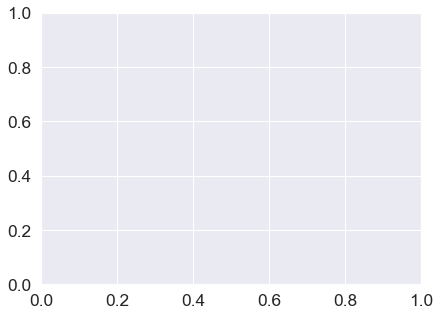

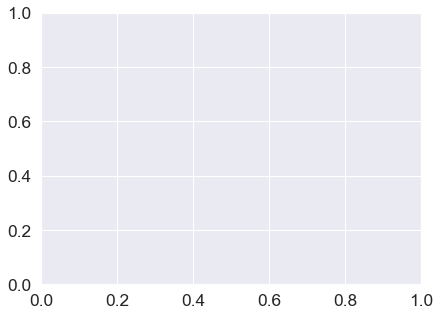

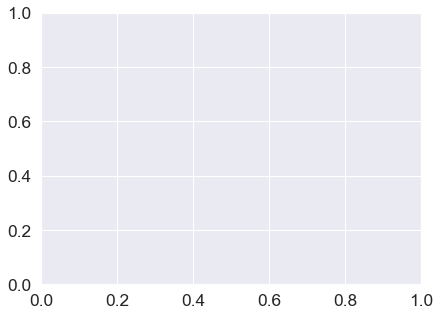

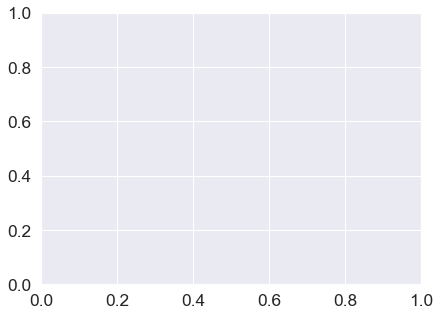

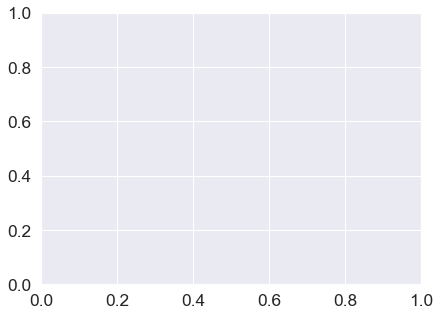

...

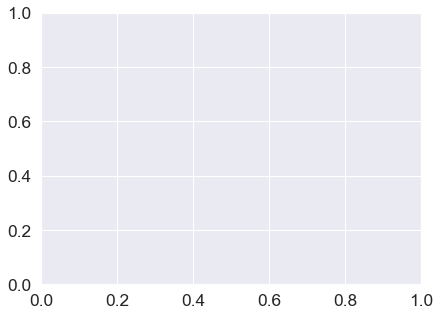

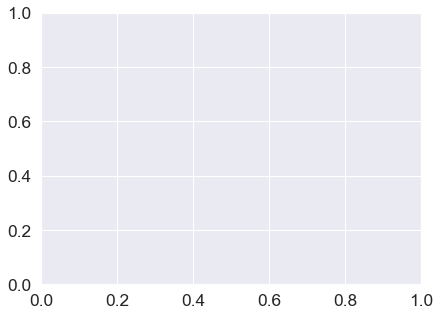

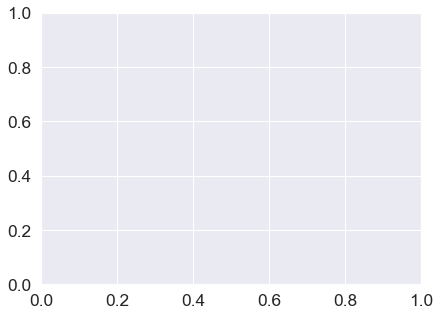

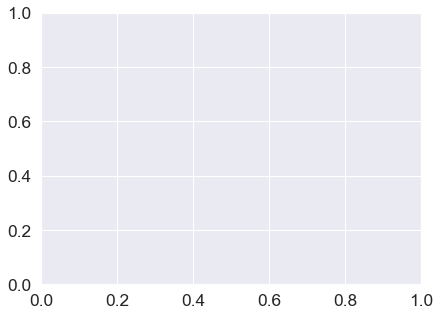

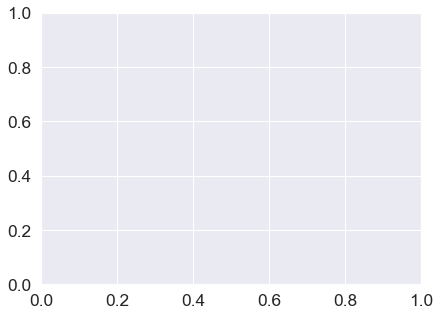

In [160]:
numTarg = 8

tWindow = 5
tStart = alignCue
tStop = numBins - 1 - 1 - tWindow
# tStop = alignCue + 1

x_targs = np.arange(1,9,1)

r2_trials = np.zeros((tStop - tStart, numNeurons, numBatches))

# going through each neuron
for iN in range(numNeurons):
    for iB in range(numBatches):
        n_bmiTargTime = np.zeros(numTarg)

        # for each time bin
        fig = plt.figure(figsize=(15,5))
        plt.subplot(1, 2, 1)
        for iT in range(tStart, tStop, 1):
            # average across the time window
            n_bmiTargTime = standardizeArray(np.sum(n_bmiAvgT[iT:iT+tWindow, iN, iB, :], axis=0))
#             plt.plot(x_targs, n_bmiTargTime, '-o', color = 'lightsteelblue', label=iT)
#             (popt, cov) = cosineFitting(x_targs, n_bmiTargTime)
            (popt, cov) = curveFitting(cosine_func, x_targs, n_bmiTargTime)
#             plt.plot(x_targs, cosine_func(x_targs, *popt), 'g--', label='fit: a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt))
            r2_trials[iT - tStart, iN, iB] = return_r2(n_bmiTargTime, cosine_func(x_targs, *popt)) 
#         plt.xlabel("Target")
#         plt.ylabel("Firing Rates (Hz)")
#     #     plt.legend()
#         plt.title("Neuron #" + str(iN + 1) + "| Batch " + str(iB))

#         plt.subplot(1, 2, 2)
#         plt.plot(np.arange(tStart, tStop, 1), r2_trials[:, iN])
#         plt.xlabel("time bins (from Go Cue)")
#         plt.ylabel("R-squared of Cosine Fit")
#         plt.title("R-squared of Cosine Fit | Neuron # " + str(iN + 1) + "| Batch " + str(iB))
#         plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

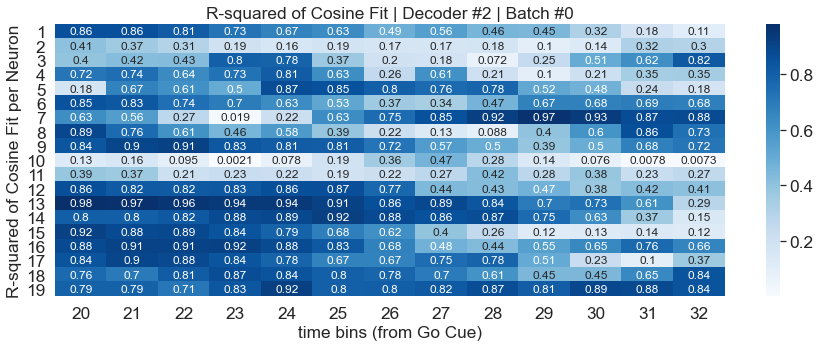

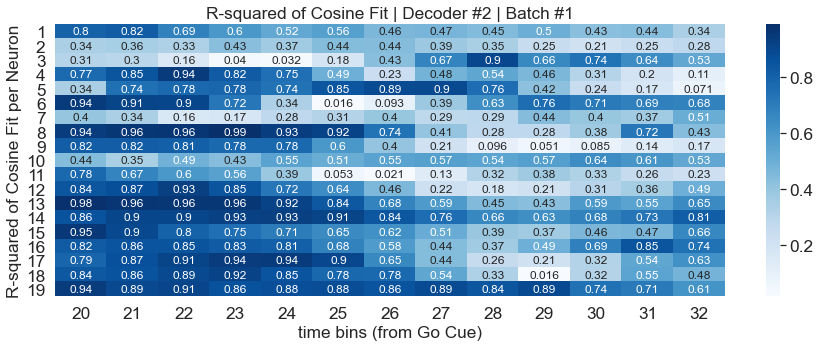

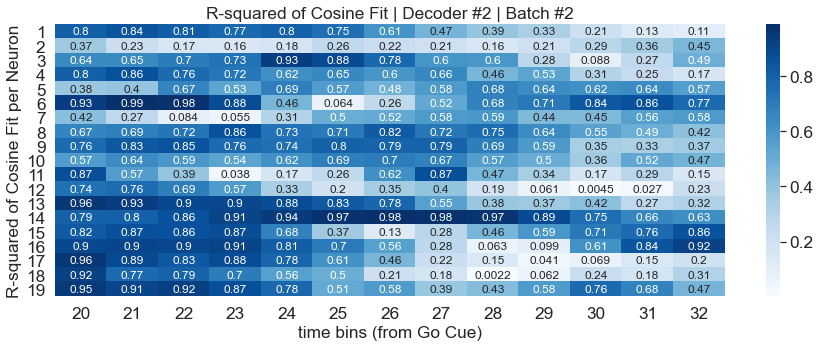

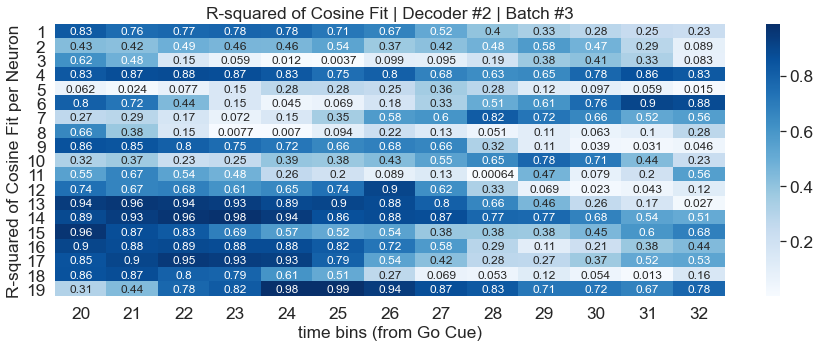

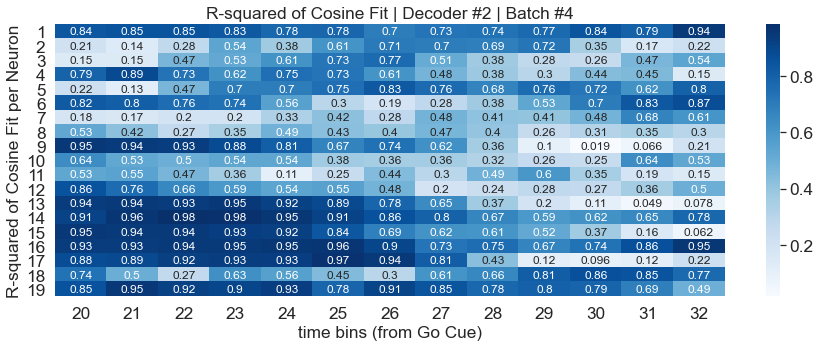

...

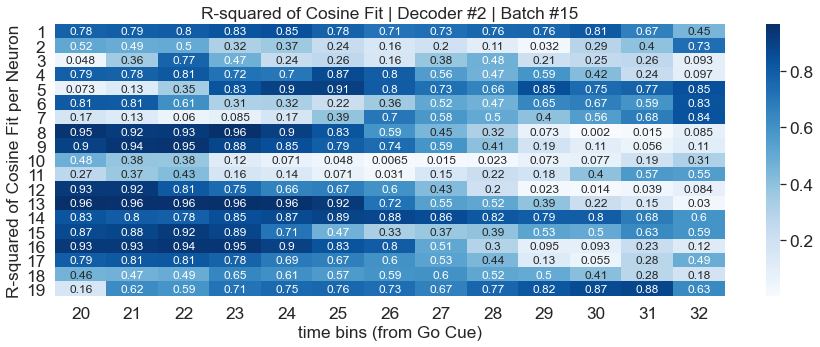

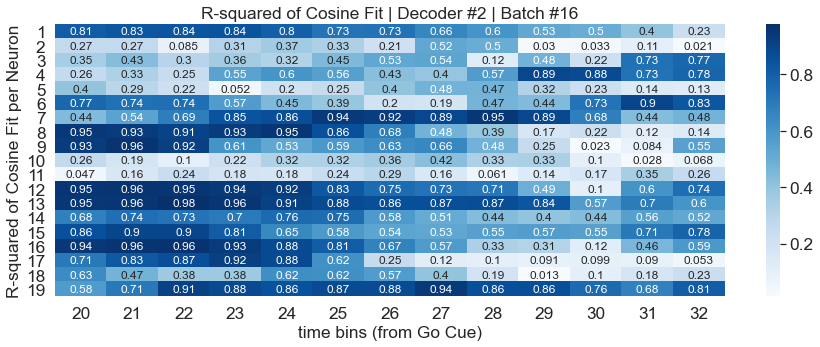

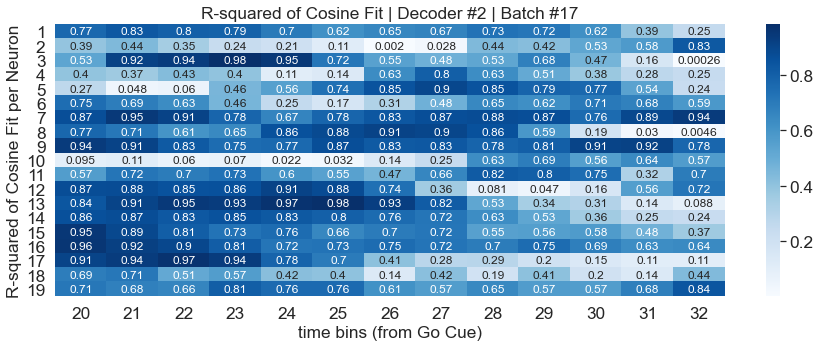

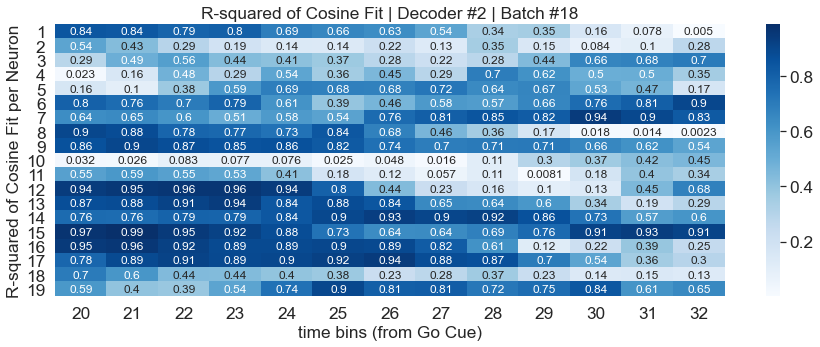

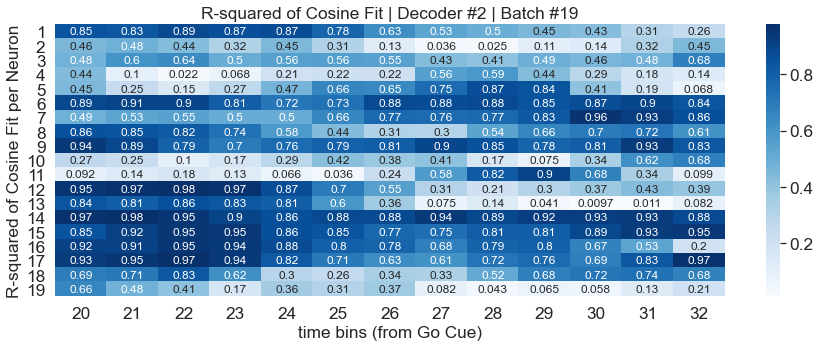

In [161]:
# # heatmap

# # r_trials = times x neurons
# # so r_trials.T = neurons x trials
# # for iN in range(numNeurons):
# for iB in range(numBatches):
#     fig = plt.figure(figsize=(15,5))
#     seaborn.heatmap(r2_trials.T[iB], cmap="Blues", annot=True, xticklabels=np.arange(tStart, tStop, 1), yticklabels=np.arange(1, numNeurons+1, 1))
# #     plt.plot(np.arange(tStart, tStop, 1), r2_trials[:, iN, iB], label=iB)
#     plt.xlabel("time bins (from Go Cue)")
#     plt.ylabel("R-squared of Cosine Fit per Neuron")
#     plt.title("R-squared of Cosine Fit | Decoder #" + str(decNum) +  " | Batch #" + str(iB))
# #     plt.legend()
#     plt.show()

## Testing this with linear regression

/Users/mmadduri/.pyenv/versions/3.8.5/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/mmadduri/.pyenv/versions/3.8.5/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/mmadduri/.pyenv/versions/3.8.5/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/mmadduri/.pyenv/versions/3.8.5/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/mmadduri/.pyenv/versions/3.8.5/lib/python3.8/

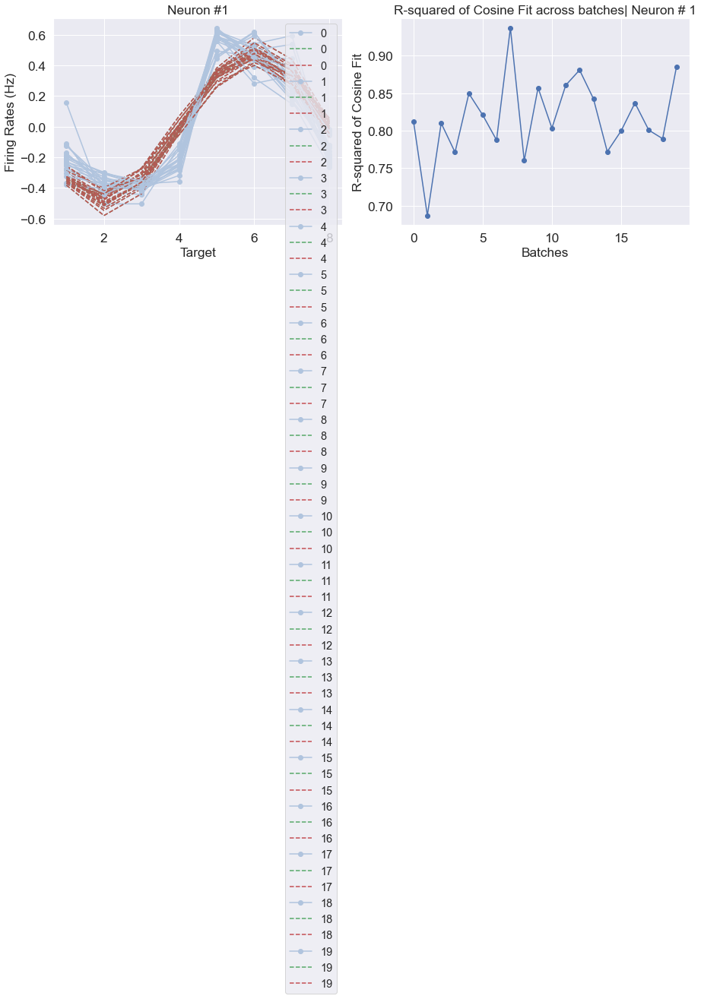

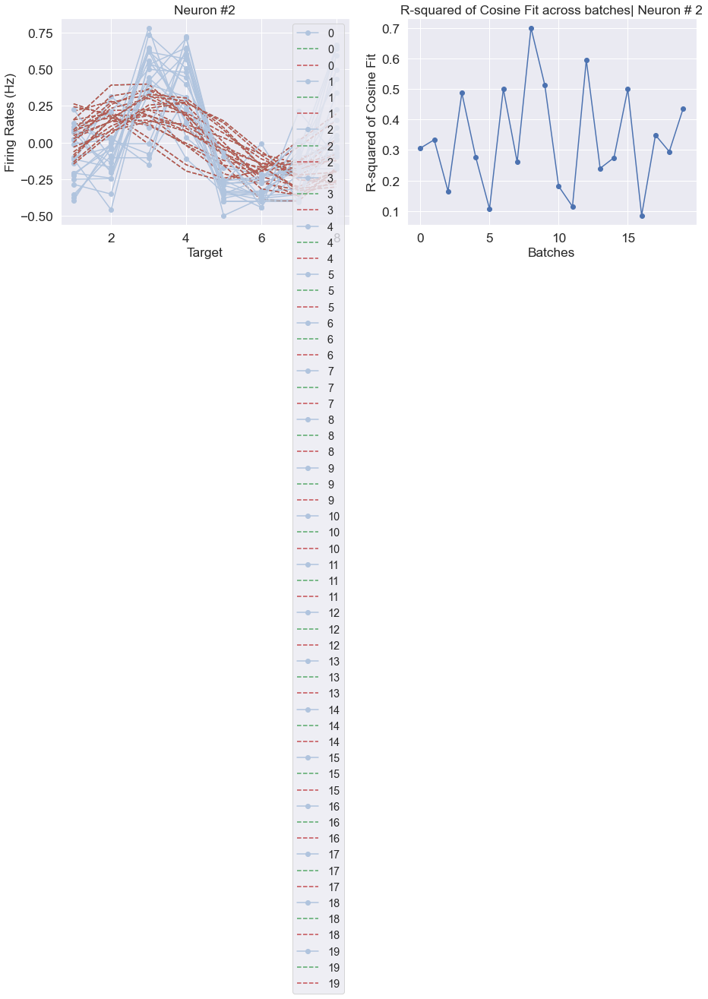

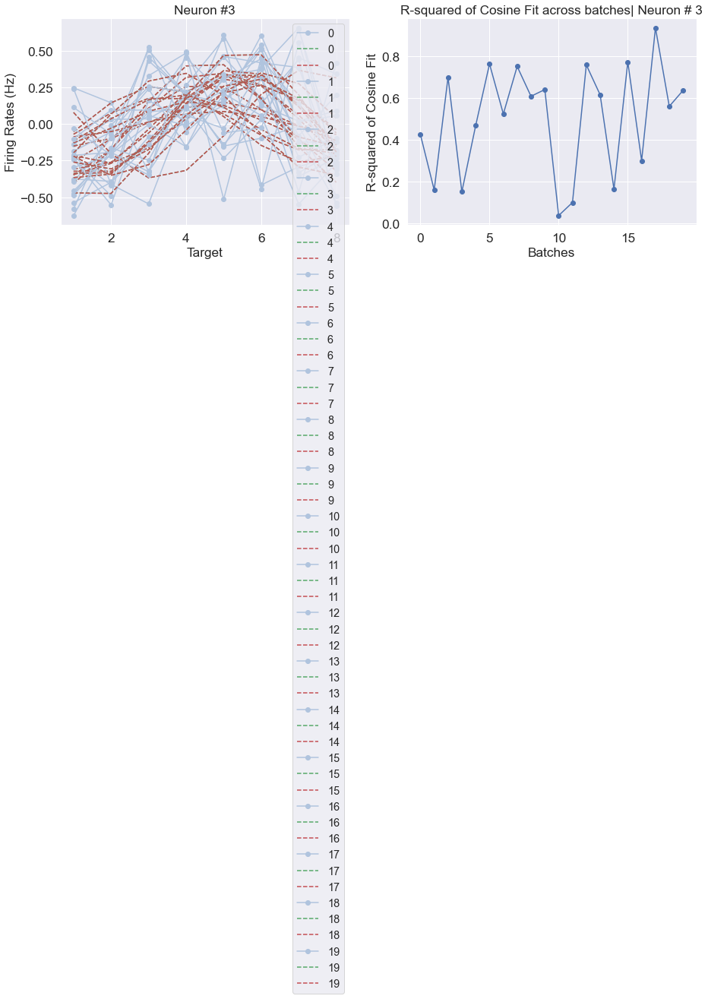

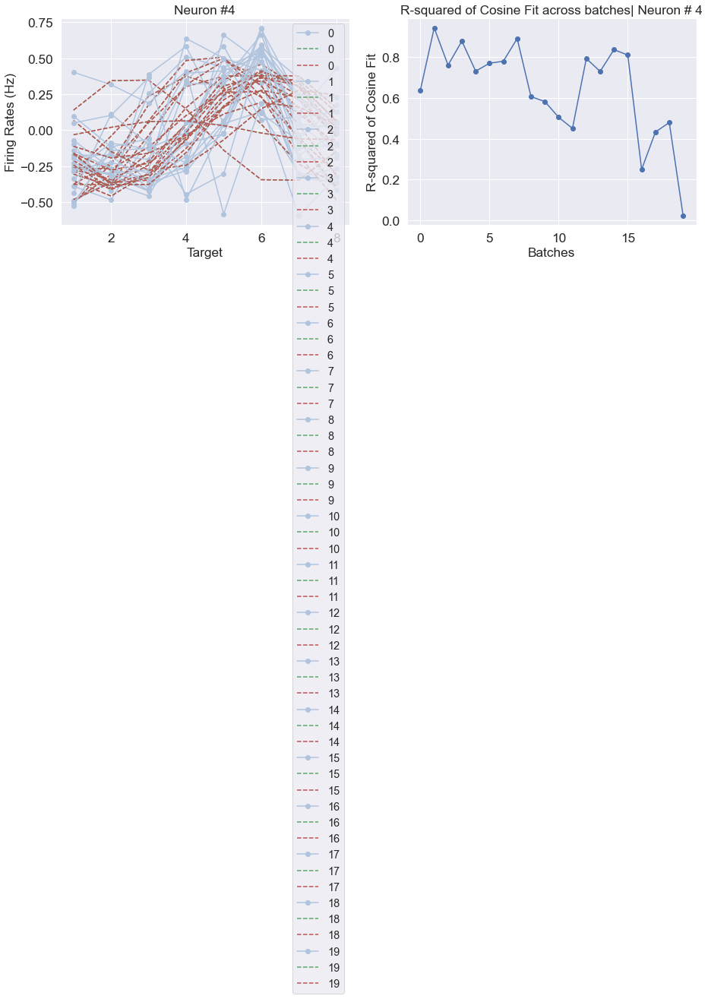

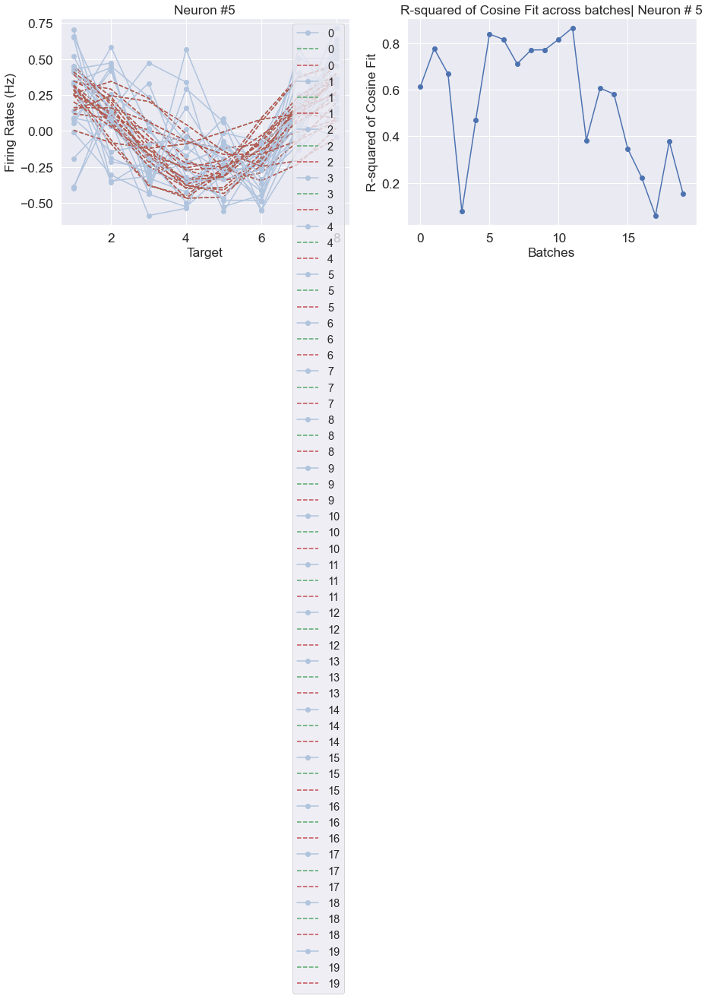

...

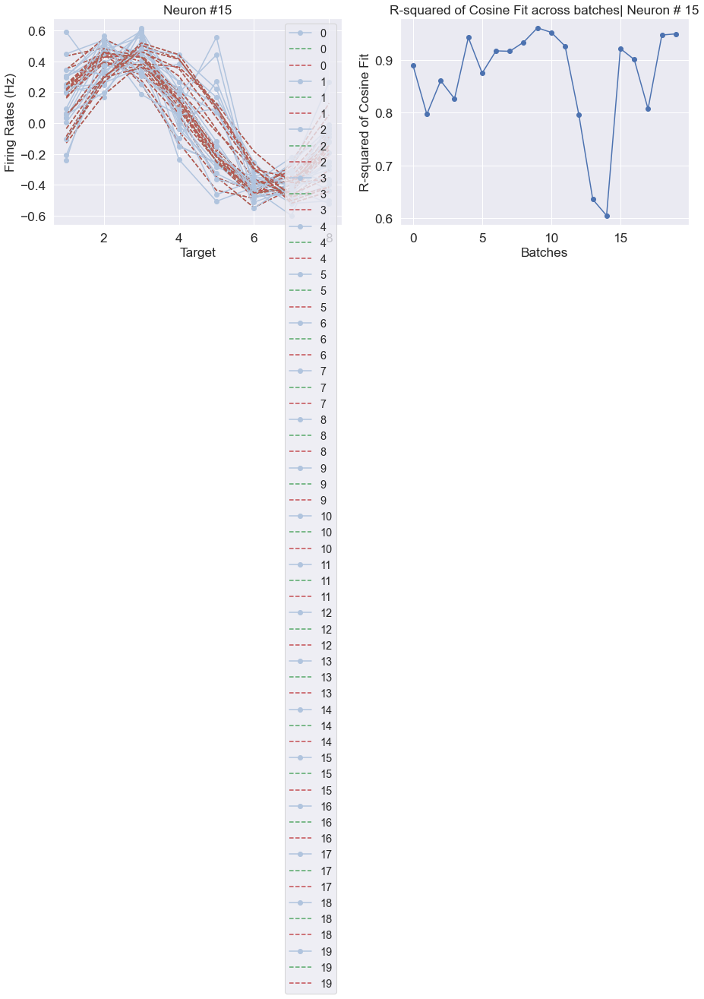

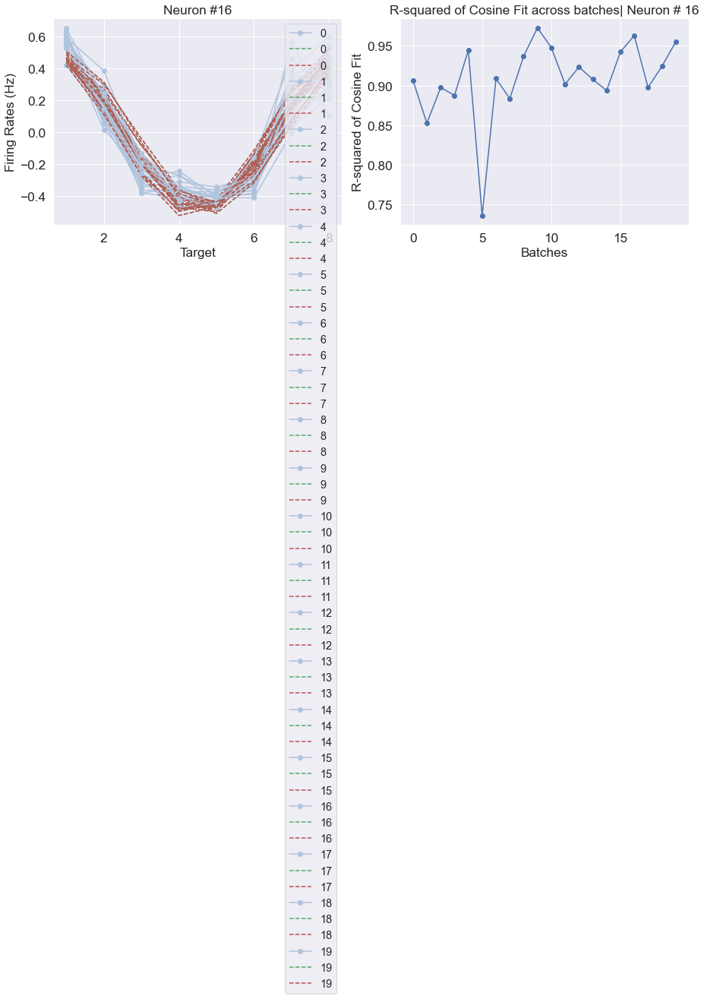

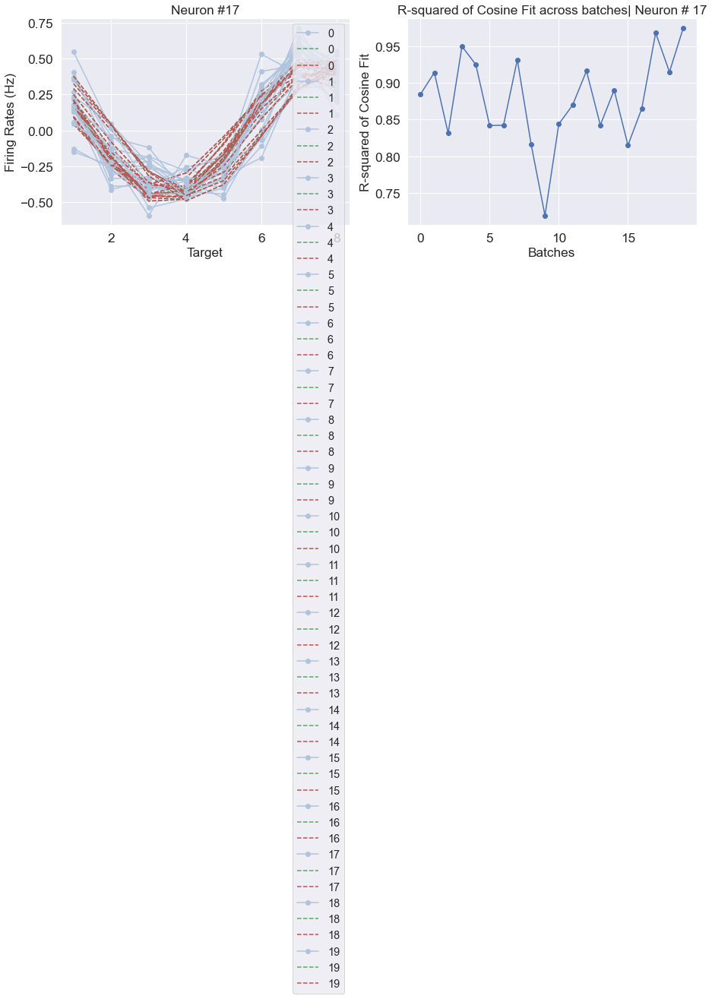

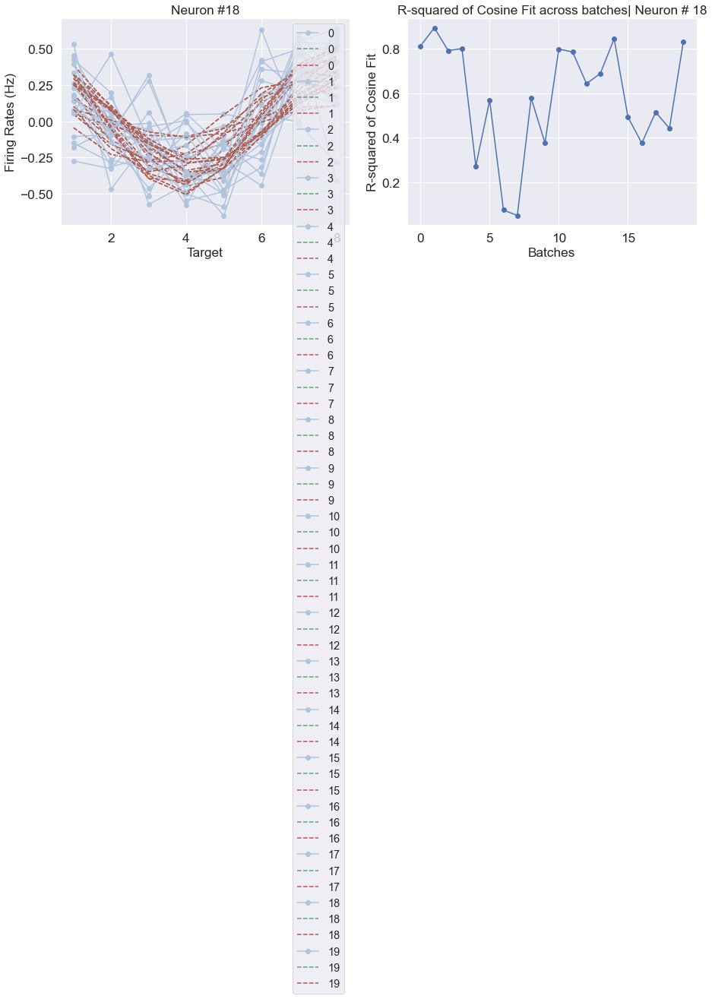

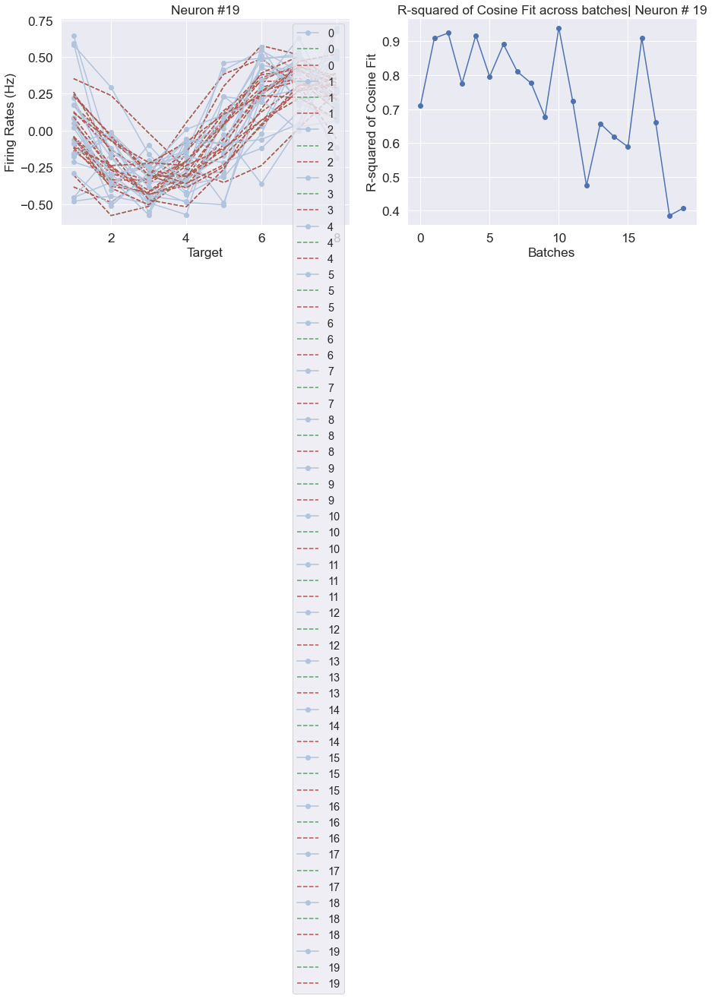

In [167]:
numTarg = 8

tWindow = 5
tStart = alignCue + 2
tStop = tStart + tWindow
# tStop = alignCue + 1

r2_cos = np.zeros((numNeurons, numBatches))
r2_lin = np.zeros((numNeurons, numBatches))
W_lin = np.zeros((numNeurons, numBatches, 3))

# going through each neuron
for iN in range(numNeurons):
    fig = plt.figure(figsize=(15,5))
    
    for iB in range(numBatches):
        n_bmiTargTime = np.zeros(numTarg)

        # for each time bin
        
        plt.subplot(1, 2, 1)
        # sum across the time window
        # standardize so this is 0 mean
        n_bmiTargTime = standardizeArray(np.sum(n_bmiAvgT[tStart:tStart+tWindow, iN, iB, :], axis=0))
        plt.plot(x_targs, n_bmiTargTime, '-o', color = 'lightsteelblue', label=iB)
            
        (popt_cos, cov_cos) = curveFitting(cosine_func, x_targs, n_bmiTargTime)
#         (popt_lin, cov_lin) = curveFitting(linear_func, targs_xy.T, n_bmiTargTime)
        (popt_lin, cov_lin) = curveFitting(linear_func, x_targs, n_bmiTargTime)
            
        plt.plot(x_targs, cosine_func(x_targs, *popt_cos), 'g--', label=iB)
        plt.plot(x_targs, linear_func(x_targs, *popt_lin), 'r--', label=iB)
#         print("cosine")
#         print("Neuron #:" + str(iN + 1) + ' fit: a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt_cos))
#         print("linear")
#         print("Neuron #:" + str(iN + 1) + ' fit: a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt_lin))
        W_lin[iN, iB, :] = popt_lin

        r2_cos[iN, iB] = return_r2(n_bmiTargTime, cosine_func(x_targs, *popt_cos)) 
        r2_lin[iN, iB] = return_r2(n_bmiTargTime, linear_func(x_targs, *popt_lin)) 
    plt.xlabel("Target")
    plt.ylabel("Firing Rates (Hz)")
    plt.legend()
    plt.title("Neuron #" + str(iN + 1))
    
    plt.subplot(1, 2, 2)
    plt.plot(r2_lin[iN],'-o')
    plt.xlabel("Batches")
    plt.ylabel("R-squared of Cosine Fit")
    plt.title("R-squared of Cosine Fit across batches| Neuron # " + str(iN + 1))
#         plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

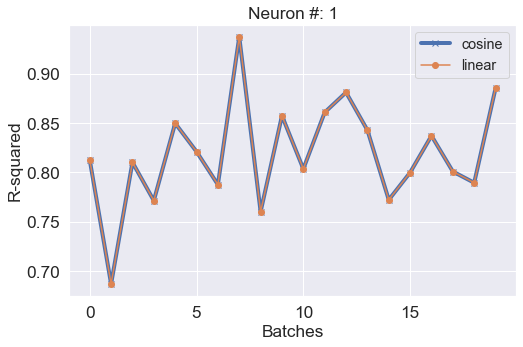

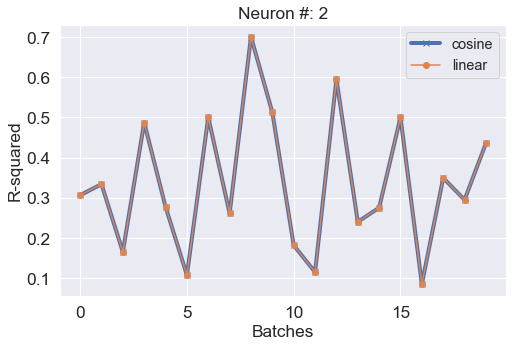

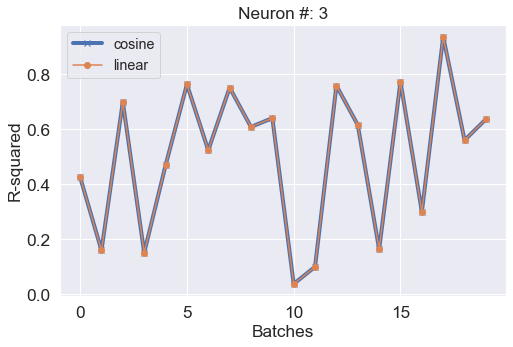

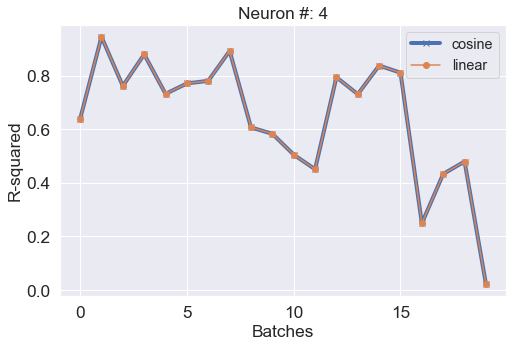

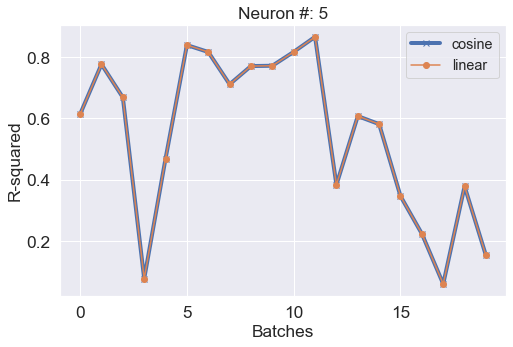

...

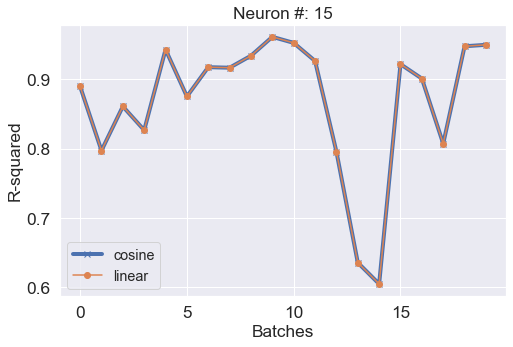

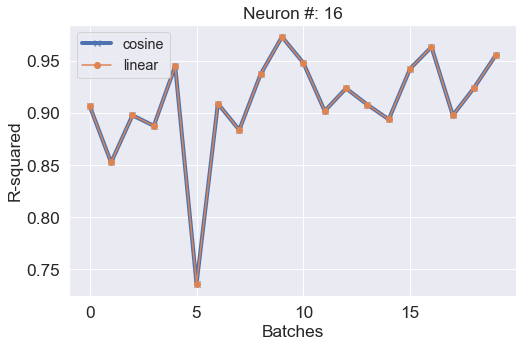

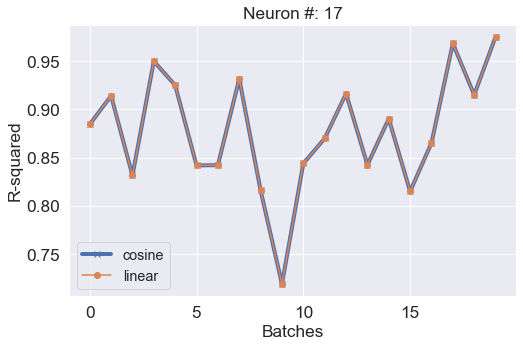

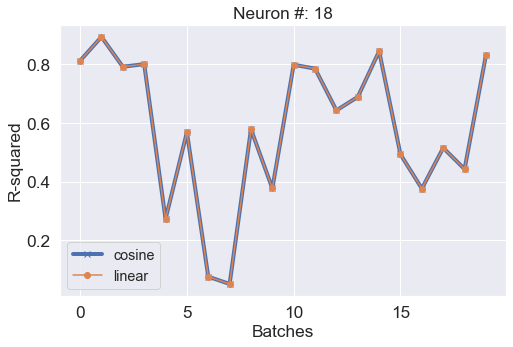

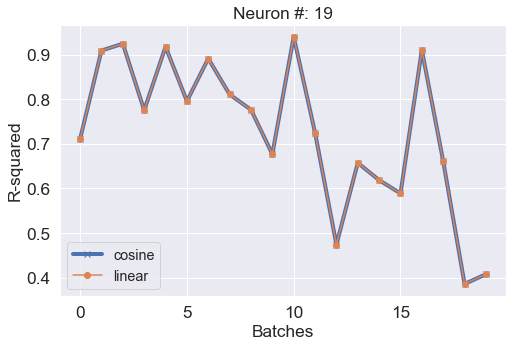

In [168]:
for iN in range(numNeurons):
    plt.plot(r2_cos[iN], '-x', linewidth=4, label = 'cosine')
    plt.plot(r2_lin[iN], '-o', label = 'linear')
    plt.title("Neuron #: " + str(iN + 1))
    plt.ylabel("R-squared")
    plt.xlabel("Batches")
    plt.legend()
    plt.show()

## July 8 2021: W matrix 


- dimensions n x m; n = number of neurons, m = task dimension
- each batch is a time step, can do this trial to trial also to get W from trial to trial

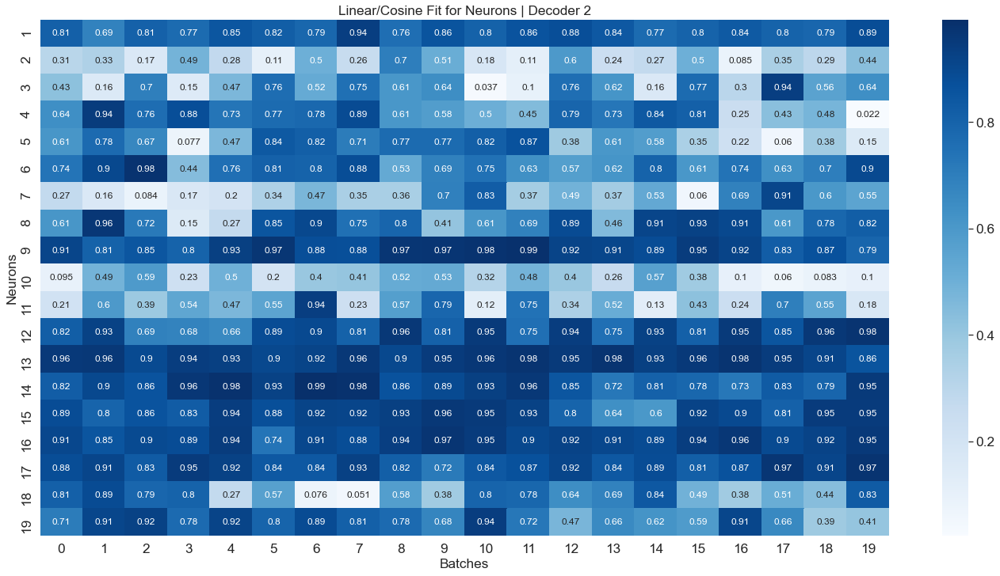

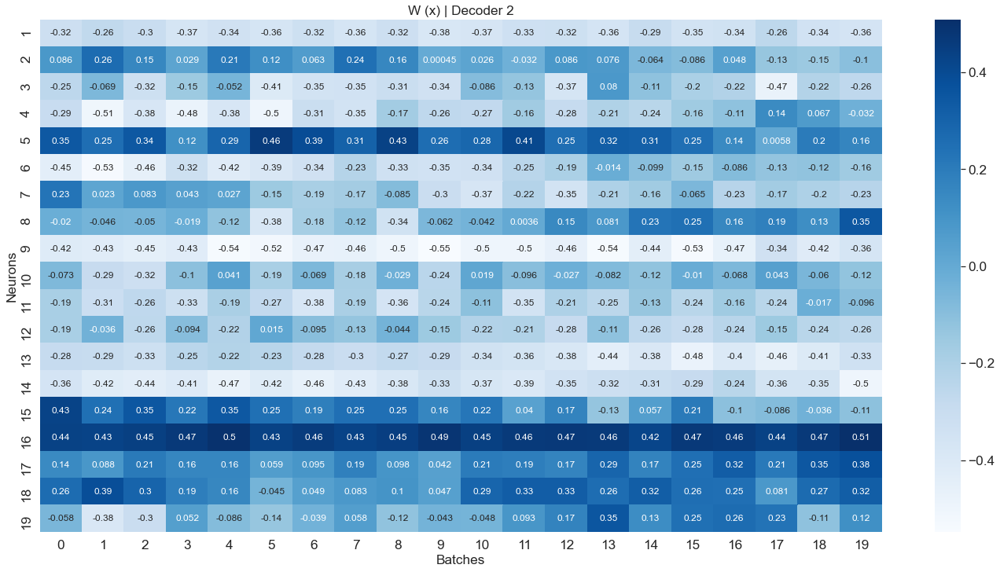

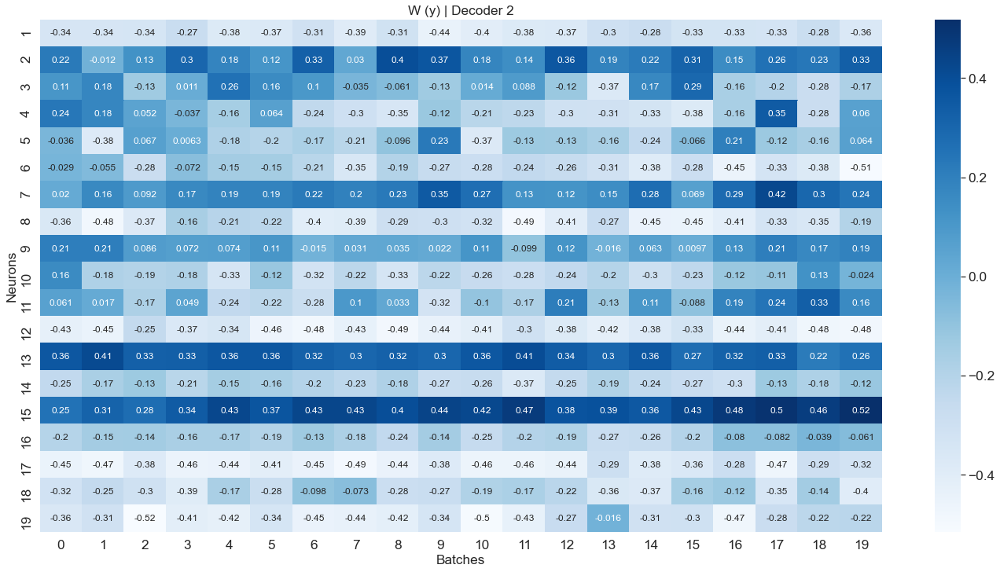

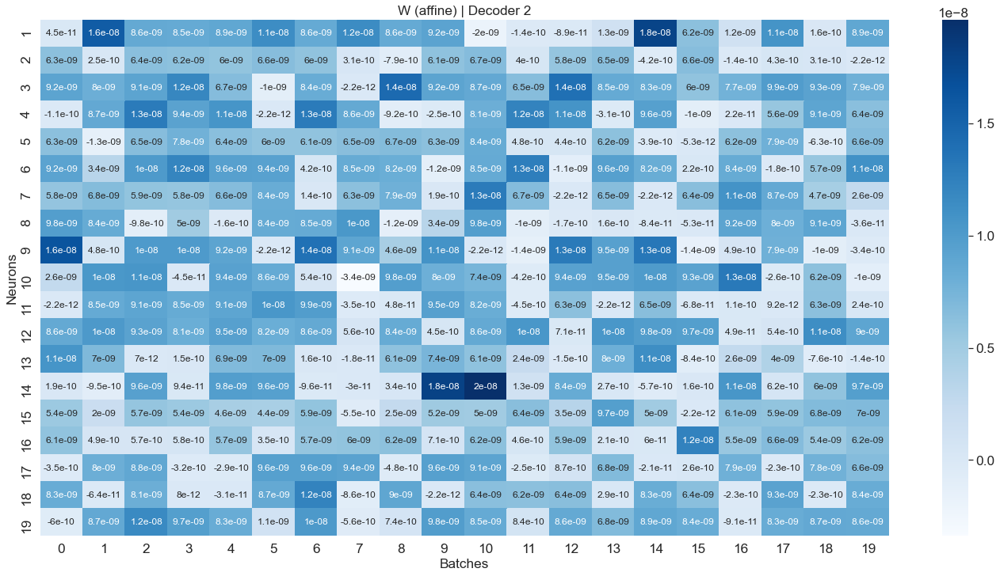

In [170]:
fig= plt.figure(figsize=(24,12))
seaborn.heatmap(r2_lin, cmap="Blues", annot=True, xticklabels=np.arange(0, numBatches, 1), yticklabels=np.arange(1, numNeurons+1, 1))
plt.xlabel("Batches")
plt.ylabel("Neurons")
plt.title("Linear/Cosine Fit for Neurons | Decoder " + str(decNum))
plt.show()


fig= plt.figure(figsize=(24,12))
# plt.subplot(1,3,1)
seaborn.heatmap(W_lin[:,:,0], cmap="Blues", annot=True, xticklabels=np.arange(0, numBatches, 1), yticklabels=np.arange(1, numNeurons+1, 1))
plt.xlabel("Batches")
plt.ylabel("Neurons")
plt.title("W (x) | Decoder " + str(decNum))
plt.show()
# plt.subplot(1,3,2)
fig= plt.figure(figsize=(24,12))
seaborn.heatmap(W_lin[:,:,1], cmap="Blues", annot=True, xticklabels=np.arange(0, numBatches, 1), yticklabels=np.arange(1, numNeurons+1, 1))
plt.xlabel("Batches")
plt.ylabel("Neurons")
plt.title("W (y) | Decoder " + str(decNum))
plt.show()
# plt.subplot(1,3,3)
fig= plt.figure(figsize=(24,12))
seaborn.heatmap(W_lin[:,:,2], cmap="Blues", annot=True, xticklabels=np.arange(0, numBatches, 1), yticklabels=np.arange(1, numNeurons+1, 1))
plt.xlabel("Batches")
plt.ylabel("Neurons")
plt.title("W (affine) | Decoder " + str(decNum))
plt.show()

(40, 19, 20, 8)